In [1]:
%matplotlib inline
import lightkurve as lk
import numpy as np
import matplotlib.pyplot as plt
from astropy.time import Time
plt.rcParams.update({'figure.max_open_warning': 0})
from astropy.io import fits
import pymc3 as pm
import pandas as pd
import exoplanet as xo
# from parameters import *

In [2]:
hostname = '2MASS J06282325-6534456'
TIC = 150428135

# period, t0, dur, depth, impact_param, r_planet, r_star = get_params(hostname)
# period_guess, t0, dur, depth, impact_param, r_planet, r_star = generate_inputs(period, t0, dur, depth, impact_param, r_planet, r_star)


# print(period_guess)

In [3]:
period_guess_b = 9.977
period_guess_c = 16.051
period_guess_d = 37.426

t0_b = 1331.359
t0_c = 1340.089
t0_d = 1330.475

In [4]:
tpf = lk.search_targetpixelfile(TIC, mission='TESS').download_all(quality_bitmask = 'hard')
print(len(tpf))

10


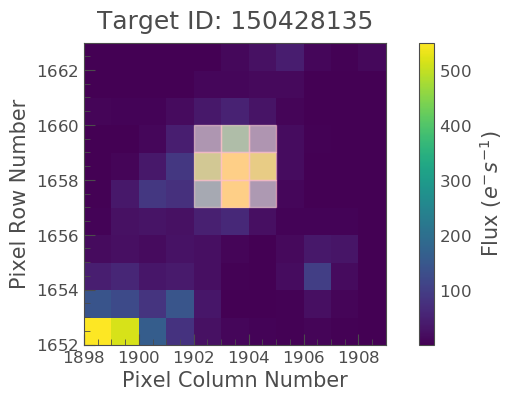

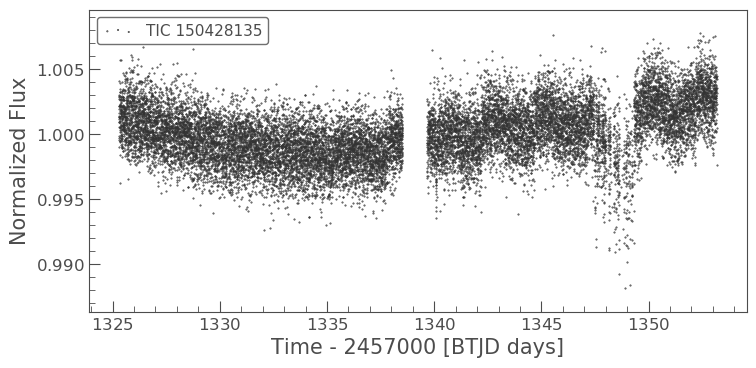

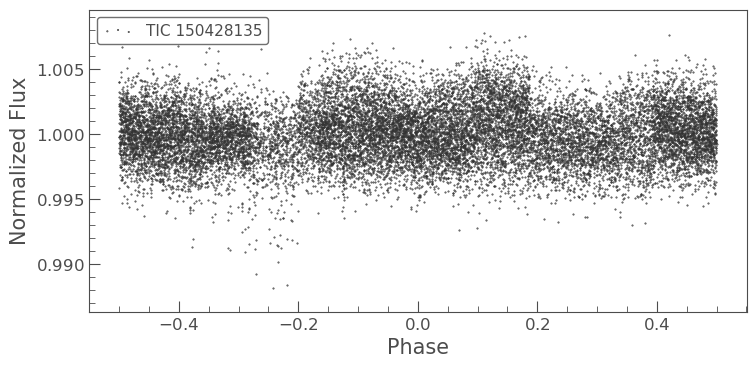

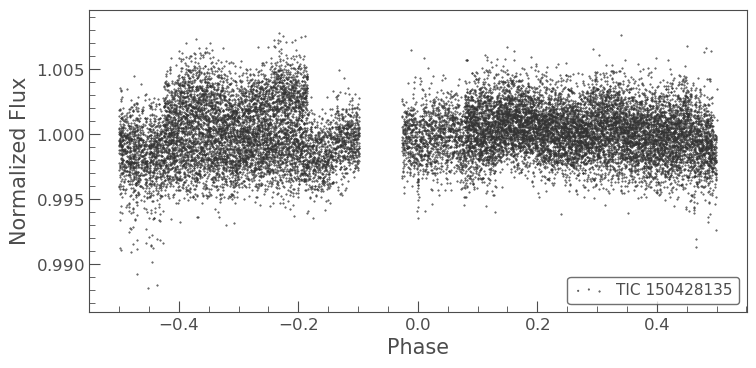

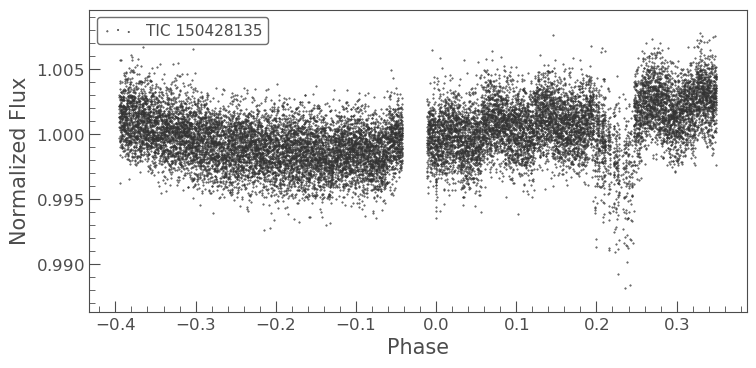

...

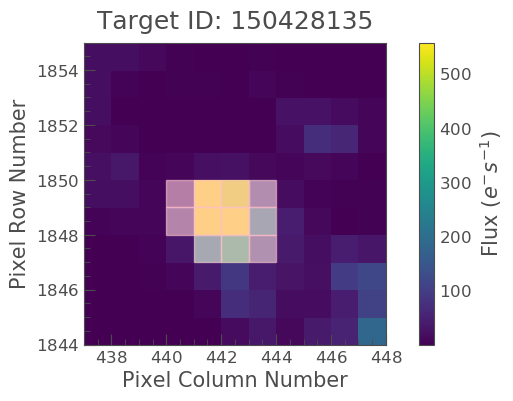

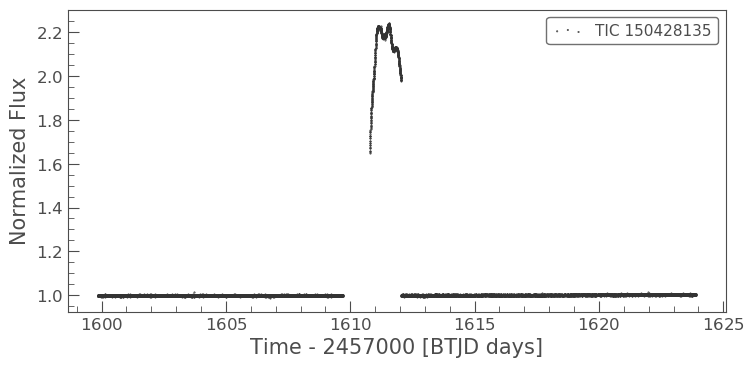

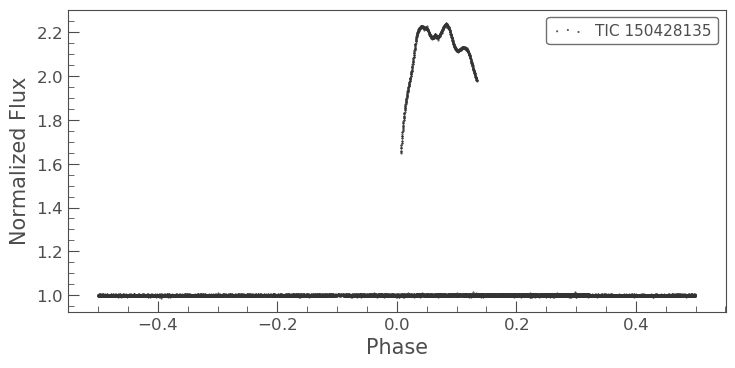

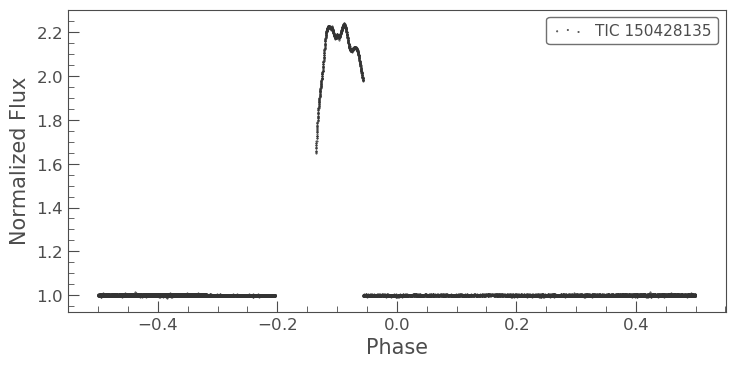

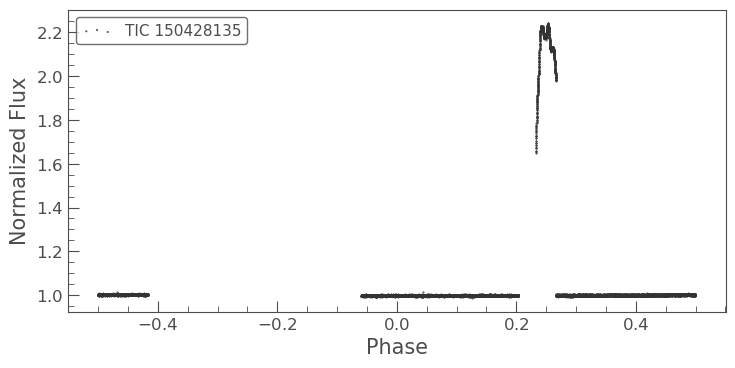

In [5]:
for i in range(len(tpf)):
    lc = tpf[i].to_lightcurve(aperture_mask=tpf[i].pipeline_mask).remove_outliers(sigma=6)#.flatten()
    tpf[i].plot(aperture_mask=tpf[i].pipeline_mask)
    lc.scatter(s=.2)
    fold_b = lc.fold(period_guess_b, t0 = t0_b)
    fold_b.scatter(s=.2)
    fold_c = lc.fold(period_guess_c, t0 = t0_c)
    fold_c.scatter(s=.2)
    fold_d = lc.fold(period_guess_d, t0 = t0_c)
    fold_d.scatter(s=.2)

In [6]:
lc = lk.search_lightcurvefile(TIC, mission='TESS',sector=1).download(quality_bitmask = 'hard').PDCSAP_FLUX.normalize().flatten()
#lc = tpf.to_lightcurve(aperture_mask=tpf.pipeline_mask).flatten().remove_outliers(sigma=6)

#sectors = [1,3,4,5,6,7,8,9,10,11,13]
sectors = [3,4,5,6,7,8,9,10,11,13]
for i in sectors:
    print(i)
    try:
        lc_temp = lk.search_lightcurvefile(TIC, mission='TESS',sector=i).download(quality_bitmask = 'hard').PDCSAP_FLUX.normalize().flatten()
        #lc_temp = tpf_temp.to_lightcurve(aperture_mask=tpf.pipeline_mask).flatten().remove_outliers(sigma=6)
        lc = lc.append(lc_temp)
        print('appended sector {}'.format(i))
    except:
        pass

3


appended sector 3
4
appended sector 4
5
appended sector 5
6
appended sector 6
7
appended sector 7
8
appended sector 8
9
appended sector 9
10
appended sector 10
11
appended sector 11
13


/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/lightkurve/search.py:177: LightkurveWarning: Cannot download from an empty search result.
  LightkurveWarning)


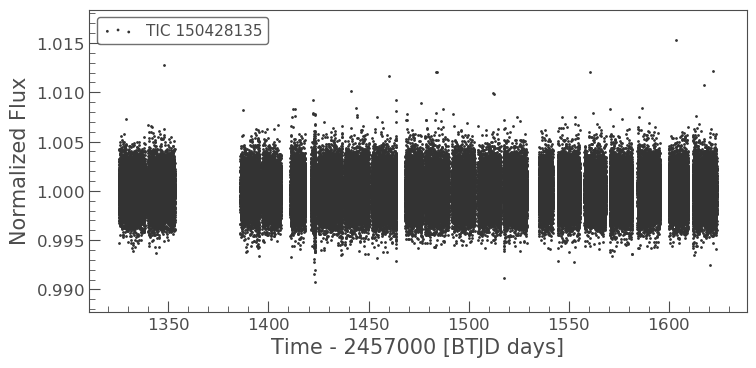

In [7]:
lc.scatter()

In [8]:
# plt.axvline(1330.475, color = 'hotpink')
# plt.scatter(lc.time, lc.flux, s = .5)
# plt.xlim(1325,1335)


(0.995, 1.005)

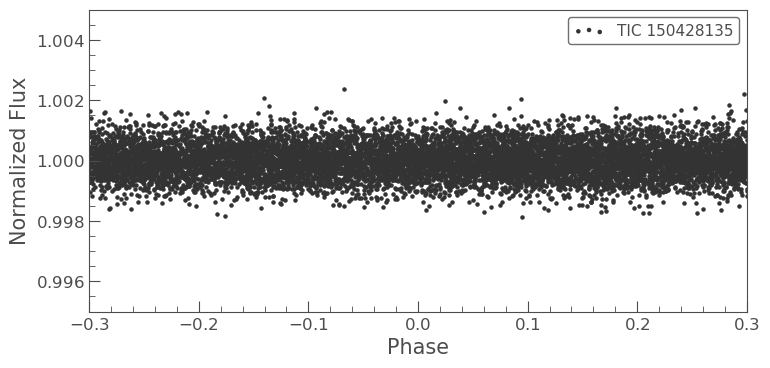

In [9]:
ax = lc.fold(period =period_guess_b, t0 = t0_b).bin(10).scatter(s=5)
ax.set_xlim(-.3,.3)
ax.set_ylim(0.995,1.005)

(0.995, 1.005)

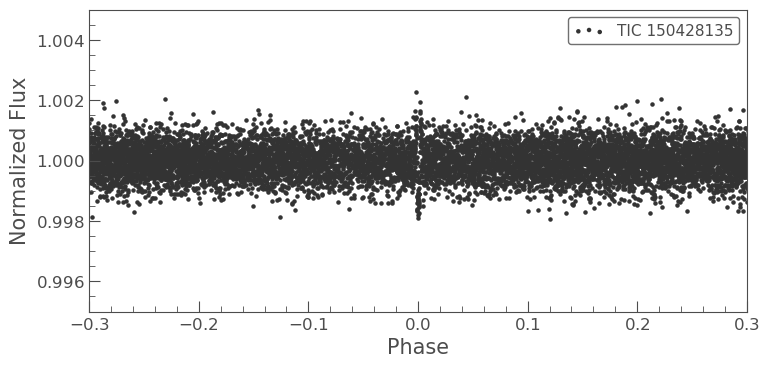

In [10]:
ax = lc.fold(period =period_guess_c, t0 = t0_c).bin(10).scatter(s=5)
ax.set_xlim(-.3,.3)
ax.set_ylim(0.995,1.005)

(0.995, 1.005)

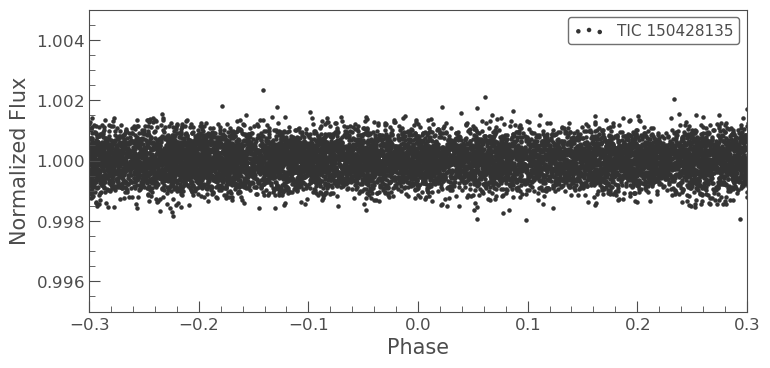

In [11]:
ax = lc.fold(period =period_guess_d, t0 = t0_d).bin(10).scatter(s=5)
ax.set_xlim(-.3,.3)
ax.set_ylim(0.995,1.005)

18104 18104
18104 18104
18104 18104


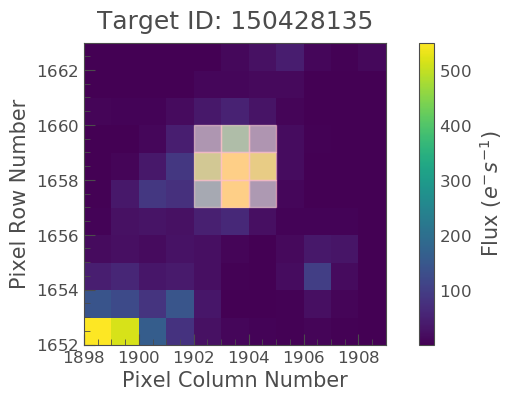

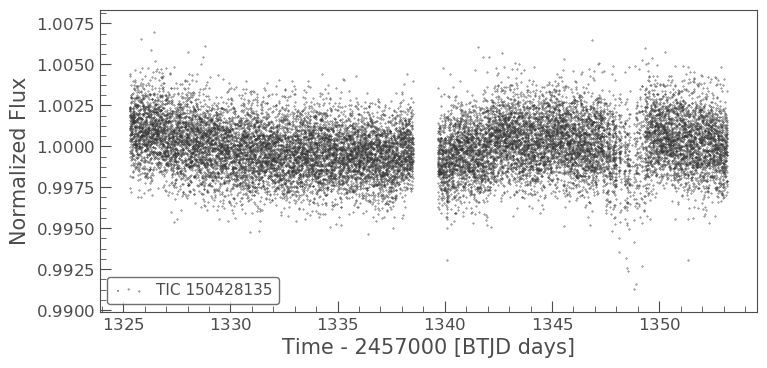

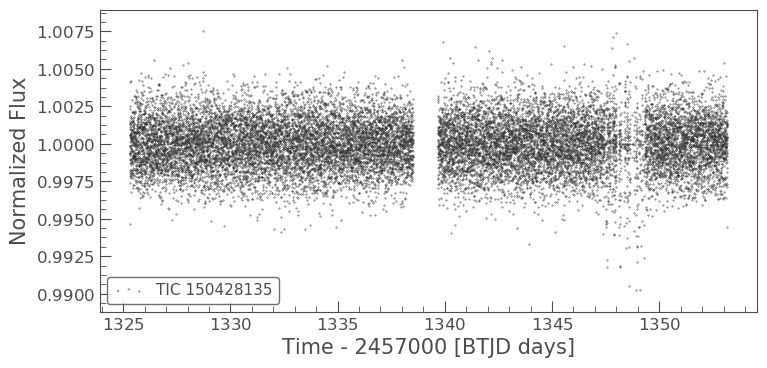

In [12]:
# plot the TPF for the target to make sure the aperture looks ok
tpf = lk.search_targetpixelfile(TIC, mission='TESS',sector = 1).download()
tpf.plot(aperture_mask=tpf.pipeline_mask)
# tpf.interact()

# run PLD on light curve to remove noise
def get_transit_mask(t, transit_time, period_guess, duration=0.2):
    hp = 0.5*period_guess
    return np.abs((t-transit_time+hp) % period_guess - hp) < 0.5*duration

mask = np.ones_like(tpf.time, dtype=bool)
print(len(tpf.time), len(mask))
mask &= get_transit_mask(tpf.time, t0_b, period_guess_b) & get_transit_mask(tpf.time, t0_c, period_guess_c) & get_transit_mask(tpf.time, t0_d, period_guess_d)

print(len(tpf.time), len(mask))

corrector = lk.PLDCorrector(tpf)
print(len(tpf.time), len(mask))
lc = corrector.correct(cadence_mask=~mask, use_gp=False)
lc = lc.remove_outliers(sigma = 6)#.remove_outliers(sigma=6)

# plot light curve without PLD corrections for comparison
lc2 = tpf.to_lightcurve(aperture_mask=tpf.pipeline_mask)
clipped_lc2 = lc2.remove_outliers(sigma=6).flatten()

ax = lc.scatter(s=0.1)
ax = clipped_lc2.scatter(s=0.1)

In [13]:
lc = lc.normalize()

13452 13452
13452 13452
13452 13452
15803 15803
15803 15803
15803 15803
17894 17894
17894 17894
17894 17894
14835 14835
14835 14835
14835 14835
16362 16362
16362 16362
16362 16362
17257 17257
17257 17257
17257 17257
18085 18085
18085 18085
18085 18085
18551 18551
18551 18551
18551 18551


/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/lightkurve/search.py:177: LightkurveWarning: Cannot download from an empty search result.
  LightkurveWarning)


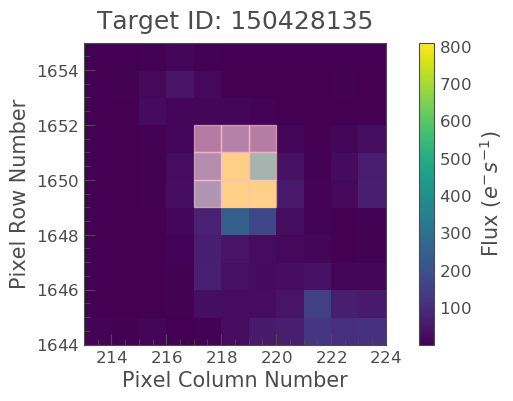

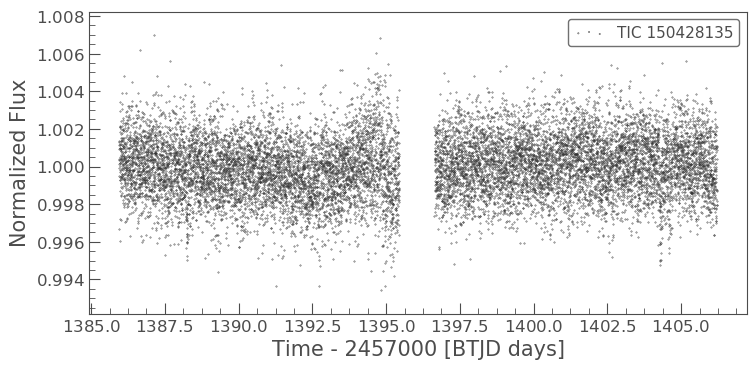

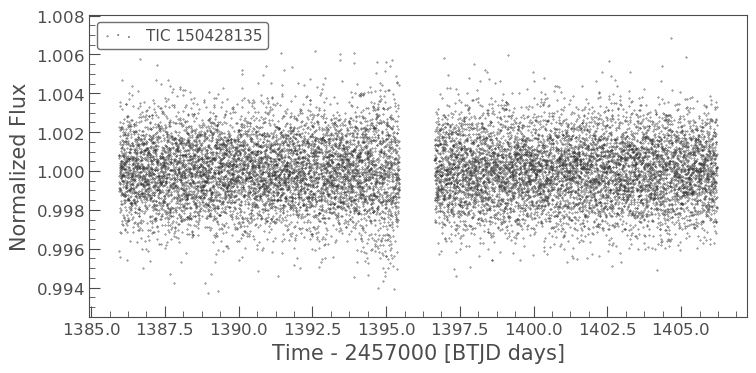

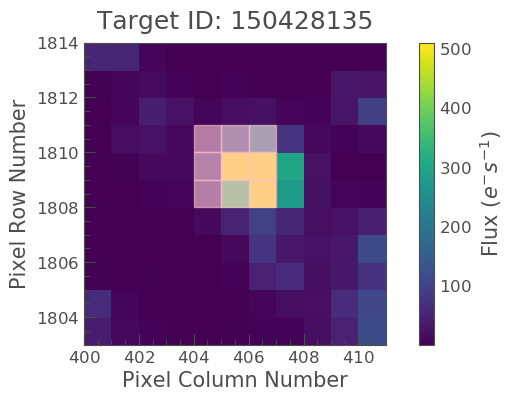

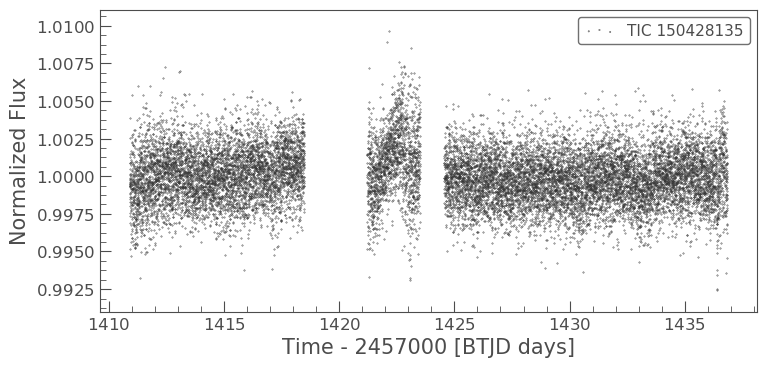

...

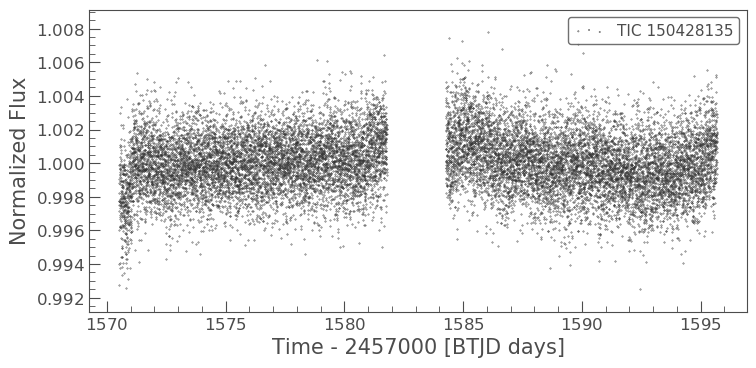

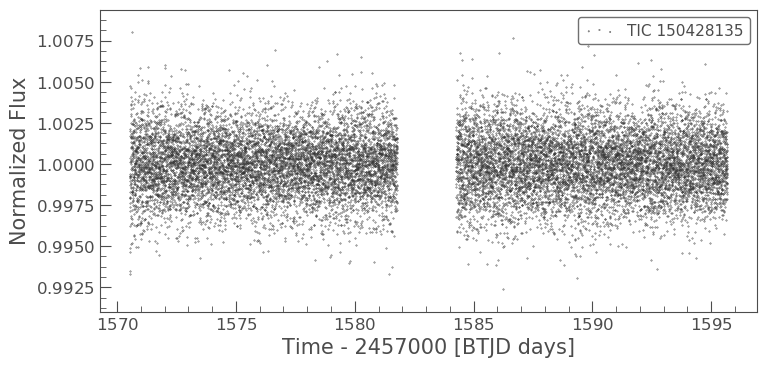

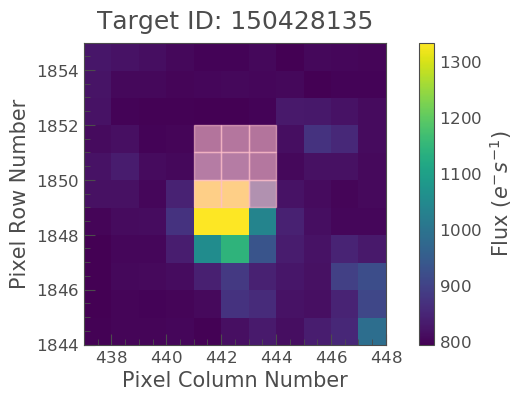

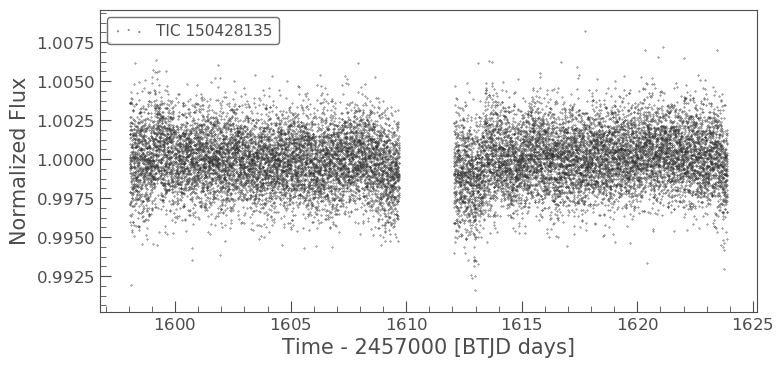

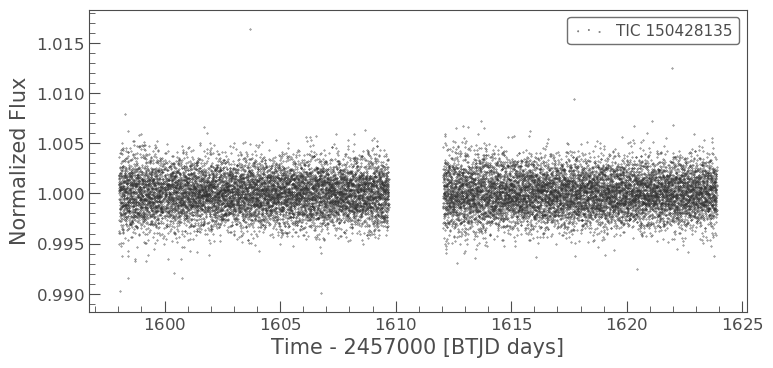

In [14]:
sectors = [3,4,5,6,7,8,9,10,11,13]

for i in sectors:
    
    try:

        tpf_0 = lk.search_targetpixelfile(TIC, mission='TESS',sector = i).download()
        tpf_0.plot(aperture_mask=tpf.pipeline_mask)
        # tpf.interact()

        # run PLD on light curve to remove noise
        def get_transit_mask(t, transit_time, period_guess, duration=0.2):
            hp = 0.5*period_guess
            return np.abs((t-transit_time+hp) % period_guess - hp) < 0.5*duration

        mask = np.ones_like(tpf_0.time, dtype=bool)
        print(len(tpf_0.time), len(mask))
        mask &= get_transit_mask(tpf_0.time, t0_b, period_guess_b) & get_transit_mask(tpf_0.time, t0_c, period_guess_c) & get_transit_mask(tpf_0.time, t0_d, period_guess_d)

        print(len(tpf_0.time), len(mask))

        corrector = lk.PLDCorrector(tpf_0)
        print(len(tpf_0.time), len(mask))
        lc_0 = corrector.correct(cadence_mask=~mask, use_gp=False)
        lc_0 = lc_0.remove_outliers(sigma = 6)#.remove_outliers(sigma=6)

        # plot light curve without PLD corrections for comparison
        lc2_0 = tpf_0.to_lightcurve(aperture_mask=tpf_0.pipeline_mask)
        clipped_lc2_0 = lc2_0.remove_outliers(sigma=4).flatten()

        ax = lc_0.scatter(s=0.1)
        ax = clipped_lc2_0.scatter(s=0.1)

        lc_0 = lc_0.normalize()
        lc = lc.append(lc_0)

        
    except:
        pass

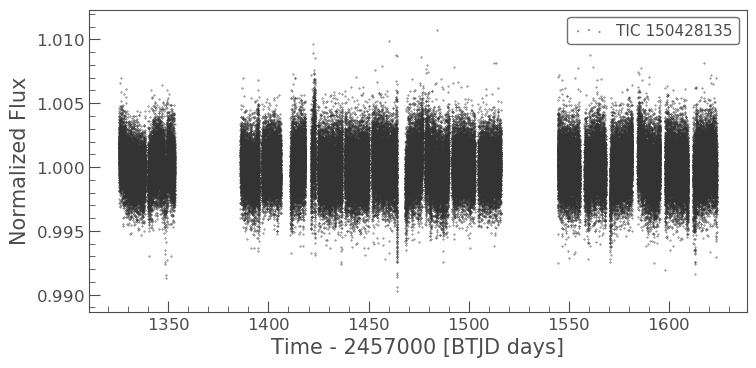

In [15]:
ax = lc.scatter(s=0.1)

In [16]:
# format data for use in xo
norm = lc.normalize()
x = np.ascontiguousarray(norm.time, dtype=np.float64)
y = np.ascontiguousarray(norm.flux, dtype=np.float64)
yerr = np.ascontiguousarray(norm.flux_err, dtype=np.float64)

In [17]:
periods = [period_guess_b, period_guess_c, period_guess_d]
t0s = [t0_b, t0_c, t0_d]

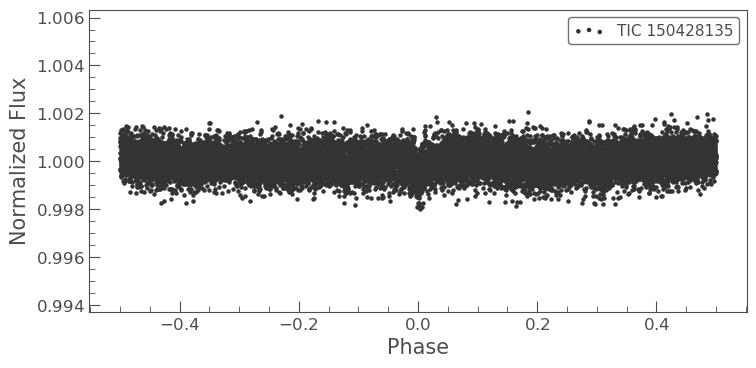

In [18]:
fold = lc.fold(period_guess_b, t0 = t0_b).bin(10)
ax = fold.scatter(s=5)

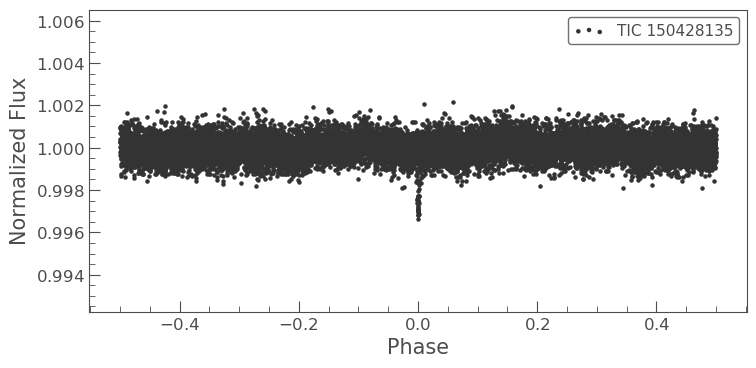

In [19]:
fold = lc.fold(period_guess_c, t0 = t0_c).bin(10)
ax = fold.scatter(s=5)

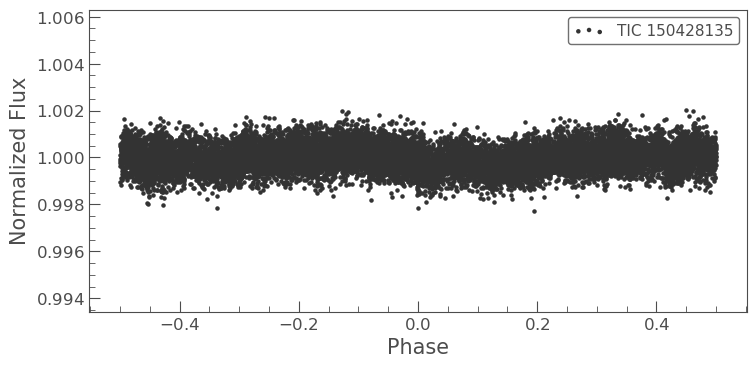

In [20]:
fold = lc.fold(period_guess_d, t0 = t0_d).bin(10)
ax = fold.scatter(s=5)

In [23]:
import pymc3 as pm

with pm.Model() as model:

    # The baseline flux
    mean = pm.Normal("mean", mu=0.0, sd=1.0)

    # The time of a reference transit for each planet
    t0 = pm.Normal("t0", mu=t0s, sd=1.0, shape=3)

    # The log period; also tracking the period itself
    logP = pm.Normal("logP", mu=np.log(periods), sd=0.1, shape=3)
    period = pm.Deterministic("period", pm.math.exp(logP))

    # The Kipping (2013) parameterization for quadratic limb darkening paramters
    u = xo.distributions.QuadLimbDark("u", testval=np.array([0.3, 0.2]))

    # The Espinoza (2018) parameterization for the joint radius ratio and
    # impact parameter distribution
    r, b = xo.distributions.get_joint_radius_impact(
        min_radius=0.015, max_radius=0.06,
        testval_r=np.array([0.052, .0268, 0.0244]),
        testval_b=np.random.rand(3)
    )
    
#         r, b = xo.distributions.get_joint_radius_impact(
#         min_radius=0.05, max_radius=0.3,
#         testval_r=np.array([0.09, 0.12, 0.22]),
#         testval_b=np.random.rand(3)
#     )

    # This shouldn't make a huge difference, but I like to put a uniform
    # prior on the *log* of the radius ratio instead of the value. This
    # can be implemented by adding a custom "potential" (log probability).
    pm.Potential("r_prior", -pm.math.log(r))

    # Set up a Keplerian orbit for the planets
    orbit = xo.orbits.KeplerianOrbit(period=period, t0=t0, b=b)

    # Compute the model light curve using starry
    light_curves = xo.StarryLightCurve(u).get_light_curve(
        orbit=orbit, r=r, t=x)
    light_curve = pm.math.sum(light_curves, axis=-1) + mean

    # Here we track the value of the model light curve for plotting
    # purposes
    pm.Deterministic("light_curves", light_curves)

    # In this line, we simulate the dataset that we will fit
    y = xo.eval_in_model(light_curve)
    y += yerr * np.random.randn(len(y))

    # The likelihood function assuming known Gaussian uncertainty
    pm.Normal("obs", mu=light_curve, sd=yerr, observed=y)


#     # Fit for the maximum a posteriori parameters given the simuated
#     # dataset
    map_soln = pm.find_MAP(start=model.test_point)
    #Fit for the maximum a posteriori parameters given the simuated dataset
    map_soln_tess = model.test_point
    map_soln_tess = xo.optimize(start=map_soln_tess, vars = [t0])
    map_soln_tess = xo.optimize(start=map_soln_tess, vars = [mean, model.rb])
    map_soln_tess = xo.optimize(start=map_soln_tess, vars = [logP, t0])
    map_soln_tess = xo.optimize(start=map_soln_tess)

/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/pymc3/tuning/starting.py:61: UserWarning: find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.
  warnings.warn('find_MAP should not be used to initialize the NUTS sampler, simply call pymc3.sample() and it will automatically initialize NUTS in a better way.')
logp = 6.475e+05, ||grad|| = 21,111: 100%|██████████| 24/24 [00:00<00:00, 47.73it/s]      


optimizing logp for variables: ['t0']


/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])
/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])


message: Desired error not necessarily achieved due to precision loss.
logp: 647483.6081194779 -> 647484.5956991588
optimizing logp for variables: ['rb_radiusimpact__', 'mean']


/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])
/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])
/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[t

message: Desired error not necessarily achieved due to precision loss.
logp: 647484.5956991588 -> 647488.5757865936
optimizing logp for variables: ['t0', 'logP']


/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])
/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])


message: Desired error not necessarily achieved due to precision loss.
logp: 647488.5757865936 -> 647488.8073041496
optimizing logp for variables: ['rb_radiusimpact__', 'u_quadlimbdark__', 'logP', 't0', 'mean']


/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])


message: Desired error not necessarily achieved due to precision loss.
logp: 647488.8073041496 -> 647488.8073041496


/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])


In [24]:
print(map_soln)

{'mean': array(-6.36172542e-07), 't0': array([1331.35900439, 1340.08899911, 1330.47499873]), 'logP': array([2.30028317, 2.77577871, 3.62231215]), 'u_quadlimbdark__': array([-1.09861229, -0.84729786]), 'rb_radiusimpact__': array([[-0.01167969, -1.00292524,  0.19931185],
       [ 1.53147641, -1.03445028, -1.331636  ]]), 'period': array([ 9.97700726, 16.05112122, 37.42399759]), 'u': array([0.3, 0.2]), 'rb': array([[0.052     , 0.0268    , 0.0244    ],
       [0.49322061, 0.25593042, 0.54777605]]), 'r': array([0.052 , 0.0268, 0.0244]), 'b': array([0.49322061, 0.25593042, 0.54777605]), 'light_curves': array([[0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.],
       ...,
       [0., 0., 0.],
       [0., 0., 0.],
       [0., 0., 0.]])}


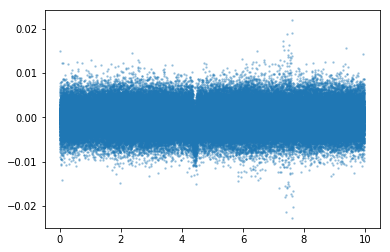

In [25]:
# plot estimated transit model over folded data
x_fold = x % period_guess_b
inds = np.argsort(x_fold)
plt.plot(x_fold, y, ".", ms=3, alpha=0.3)
# with model:
#     plt.plot(x_fold[inds], xo.utils.eval_in_model(light_curve)[inds])
#     plt.plot(x_fold[inds], xo.utils.eval_in_model(light_curve, map_soln)[inds])

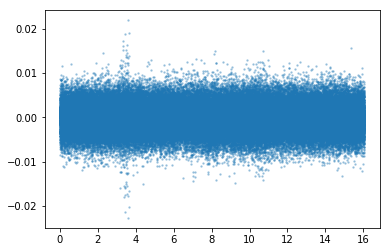

In [26]:
# plot estimated transit model over folded data
x_fold = x % period_guess_c
inds = np.argsort(x_fold)
plt.plot(x_fold, y, ".", ms=3, alpha=0.3)
# with model:
#     plt.plot(x_fold[inds], xo.utils.eval_in_model(light_curve)[inds])
#     plt.plot(x_fold[inds], xo.utils.eval_in_model(light_curve, map_soln)[inds])

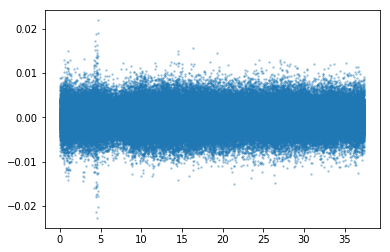

In [27]:
# plot estimated transit model over folded data
x_fold = x % period_guess_d
inds = np.argsort(x_fold)
plt.plot(x_fold, y, ".", ms=3, alpha=0.3)
# with model:
#     plt.plot(x_fold[inds], xo.utils.eval_in_model(light_curve)[inds])
#     plt.plot(x_fold[inds], xo.utils.eval_in_model(light_curve, map_soln)[inds])

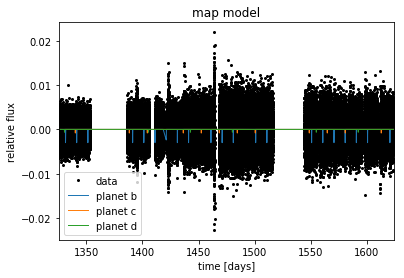

In [28]:
t = x
plt.plot(t, y, ".k", ms=4, label="data")
for i, l in enumerate("bcd"):
    plt.plot(t, map_soln["light_curves"][:, i], lw=1,
             label="planet {0}".format(l))
plt.xlim(t.min(), t.max())
plt.ylabel("relative flux")
plt.xlabel("time [days]")
plt.legend(fontsize=10)
plt.title("map model");

In [29]:
np.random.seed(42)
sampler = xo.PyMC3Sampler(window=100, finish=200)
with model:
    burnin = sampler.tune(tune=2500, start=map_soln, step_kwargs=dict(target_accept=0.9))
    trace = sampler.sample(draws=3000)


/Users/emilygilbert/anaconda3/lib/python3.7/site-packages/theano/tensor/subtensor.py:2197: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  rval = inputs[0].__getitem__(inputs[1:])
Sampling 2 chains: 100%|██████████| 404/404 [23:45<00:00, 14.77s/draws]  
Multiprocess sampling (2 chains in 2 jobs)
NUTS: [rb, u, logP, t0, mean]
Sampling 2 chains: 100%|██████████| 6000/6000 [19:43:28<00:00,  9.36s/draws]        
The estimated number of effective samples is smaller than 200 for some parameters.


In [30]:
pm.summary(trace, varnames=["period", "t0", "r", "b", "u", "mean"])

,mean,sd,mc_error,hpd_2.5,hpd_97.5,n_eff,Rhat
period__0,9.976975e+00,0.000065,8.329291e-07,9.976847,9.977099,5692.737081,1.000230
period__1,1.605004e+01,0.000963,3.324200e-05,16.048299,16.051957,726.382502,1.004589
period__2,3.742050e+01,0.024462,1.895141e-03,37.357303,37.450989,48.289497,1.027735
t0__0,1.331360e+03,0.000910,1.173223e-05,1331.357810,1331.361397,5707.363738,0.999897
t0__1,1.340103e+03,0.010605,3.948175e-04,1340.082486,1340.119354,630.615464,1.006359
t0__2,1.330446e+03,0.063714,3.697034e-03,1330.331385,1330.568418,114.858435,1.006202
r__0,5.240386e-02,0.000702,1.035661e-05,0.050996,0.053761,4061.160513,1.000698
r__1,2.820490e-02,0.001231,1.868819e-05,0.025657,0.030491,4499.982902,1.000097
r__2,2.031185e-02,0.004642,2.571123e-04,0.015044,0.027721,99.611860,1.013466
b__0,4.978584e-01,0.015825,2.531094e-04,0.466969,0.528255,3708.252016,1.000824


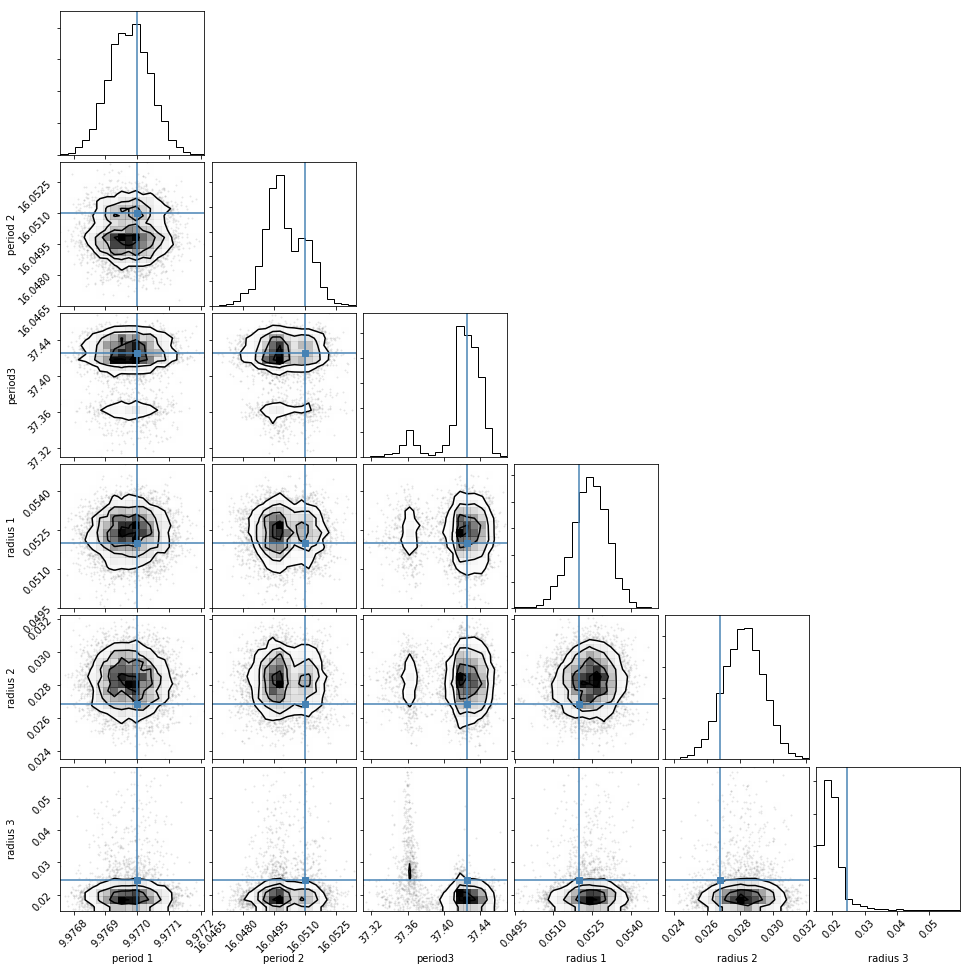

In [31]:
import corner
samples = pm.trace_to_dataframe(trace, varnames=["period", "r"])
truth = np.concatenate(xo.eval_in_model([period, r], model.test_point, model=model))
corner.corner(samples, truths=truth, labels=["period 1", "period 2", "period3", "radius 1", "radius 2", "radius 3"]);


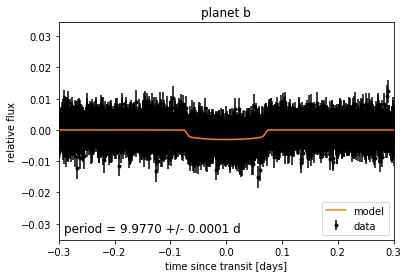

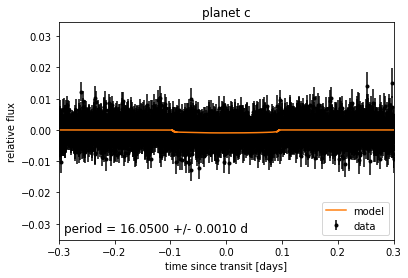

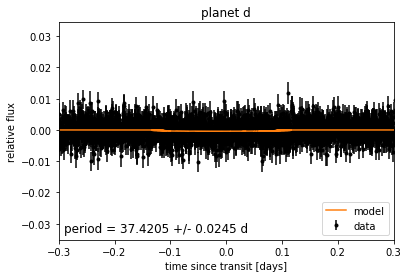

In [32]:
for n, letter in enumerate("bcd"):
    plt.figure()

    # Get the posterior median orbital parameters
    p = np.median(trace["period"][:, n])
    t0 = np.median(trace["t0"][:, n])

    # Compute the median of posterior estimate of the contribution from
    # the other planet. Then we can remove this from the data to plot
    # just the planet we care about.
    other = np.median(trace["light_curves"][:, :, (n + 1) % 2], axis=0)

    # Plot the folded data
    x_fold = (t - t0 + 0.5*p) % p - 0.5*p
    plt.errorbar(x_fold, y - other, yerr=yerr, fmt=".k", label="data",
                 zorder=-1000)

    # Plot the folded model
    inds = np.argsort(x_fold)
    inds = inds[np.abs(x_fold)[inds] < 0.3]
    pred = trace["light_curves"][:, inds, n] + trace["mean"][:, None]
    pred = np.median(pred, axis=0)
    plt.plot(x_fold[inds], pred, color="C1", label="model")

    # Annotate the plot with the planet's period
    txt = "period = {0:.4f} +/- {1:.4f} d".format(
        np.mean(trace["period"][:, n]), np.std(trace["period"][:, n]))
    plt.annotate(txt, (0, 0), xycoords="axes fraction",
                 xytext=(5, 5), textcoords="offset points",
                 ha="left", va="bottom", fontsize=12)

    plt.legend(fontsize=10, loc=4)
    plt.xlim(-0.5*p, 0.5*p)
    plt.xlabel("time since transit [days]")
    plt.ylabel("relative flux")
    plt.title("planet {0}".format(letter));
    plt.xlim(-0.3, 0.3)

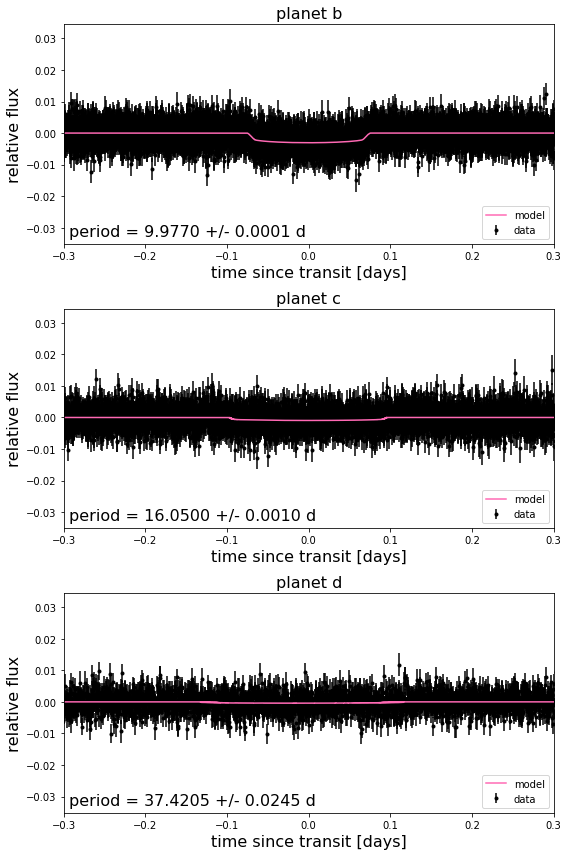

In [33]:

fig, ax = plt.subplots(3,1, figsize=(8,12))

for n, letter in enumerate("bcd"):

    # Get the posterior median orbital parameters
    p = np.median(trace["period"][:, n])
    t0 = np.median(trace["t0"][:, n])

    # Compute the median of posterior estimate of the contribution from
    # the other planet. Then we can remove this from the data to plot
    # just the planet we care about.
    other = np.median(trace["light_curves"][:, :, (n + 1) % 2], axis=0)

    # Plot the folded data
    x_fold = (t - t0 + 0.5*p) % p - 0.5*p
    ax[n].errorbar(x_fold, y - other, yerr=yerr, fmt=".k", label="data",
                 zorder=-1000)

    # Plot the folded model
    inds = np.argsort(x_fold)
    inds = inds[np.abs(x_fold)[inds] < 0.3]
    pred = trace["light_curves"][:, inds, n] + trace["mean"][:, None]
    pred = np.median(pred, axis=0)
    ax[n].plot(x_fold[inds], pred, color="hotpink", label="model")

    # Annotate the plot with the planet's period
    txt = "period = {0:.4f} +/- {1:.4f} d".format(
        np.mean(trace["period"][:, n]), np.std(trace["period"][:, n]))
    ax[n].annotate(txt, (0, 0), xycoords="axes fraction",
                 xytext=(5, 5), textcoords="offset points",
                 ha="left", va="bottom", fontsize=16)

    ax[n].legend(fontsize=10, loc=4)
    ax[n].set_xlim(-0.5*p, 0.5*p)
    ax[n].set_xlabel("time since transit [days]", fontsize=16)
    ax[n].set_ylabel("relative flux", fontsize=16)
    ax[n].set_title("planet {0}".format(letter), fontsize=16);
    ax[n].set_xlim(-0.3, 0.3)

# fig = plt.figure(figsize=(15,10))

plt.tight_layout()
                       
# plt.show()

plt.savefig('toi700.png', dpi = 200)

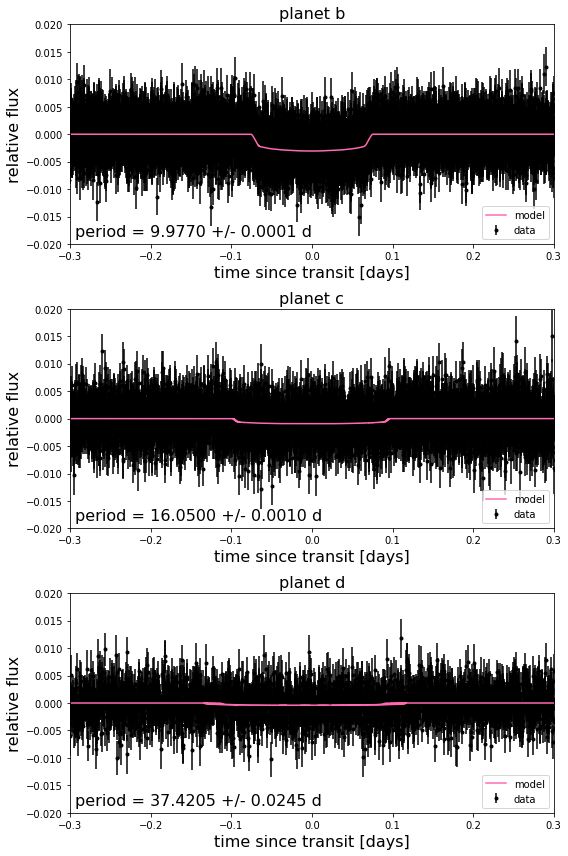

In [34]:

fig, ax = plt.subplots(3,1, figsize=(8,12))

for n, letter in enumerate("bcd"):

    # Get the posterior median orbital parameters
    p = np.median(trace["period"][:, n])
    t0 = np.median(trace["t0"][:, n])

    # Compute the median of posterior estimate of the contribution from
    # the other planet. Then we can remove this from the data to plot
    # just the planet we care about.
    other = np.median(trace["light_curves"][:, :, (n + 1) % 2], axis=0)

    # Plot the folded data
    x_fold = (t - t0 + 0.5*p) % p - 0.5*p
    ax[n].errorbar(x_fold, y - other, yerr=yerr, fmt=".k", label="data",
                 zorder=-1000)

    # Plot the folded model
    inds = np.argsort(x_fold)
    inds = inds[np.abs(x_fold)[inds] < 0.3]
    pred = trace["light_curves"][:, inds, n] + trace["mean"][:, None]
    pred = np.median(pred, axis=0)
    ax[n].plot(x_fold[inds], pred, color="hotpink", label="model")

    # Annotate the plot with the planet's period
    txt = "period = {0:.4f} +/- {1:.4f} d".format(
        np.mean(trace["period"][:, n]), np.std(trace["period"][:, n]))
    ax[n].annotate(txt, (0, 0), xycoords="axes fraction",
                 xytext=(5, 5), textcoords="offset points",
                 ha="left", va="bottom", fontsize=16)

    ax[n].legend(fontsize=10, loc=4)
    ax[n].set_xlim(-0.5*p, 0.5*p)
    ax[n].set_xlabel("time since transit [days]", fontsize=16)
    ax[n].set_ylabel("relative flux", fontsize=16)
    ax[n].set_title("planet {0}".format(letter), fontsize=16);
    ax[n].set_xlim(-0.3, 0.3)
    ax[n].set_ylim(-0.02, 0.02)

# fig = plt.figure(figsize=(15,10))

plt.tight_layout()
                       
# plt.show()

plt.savefig('toi700_1.png', dpi = 200)